In [1]:
import scipy.io
import numpy as np 
import matplotlib.pyplot as plt

def mat_to_array(file_path):
    # Load the .mat file
    mat_data = scipy.io.loadmat(file_path)

    # Access the data you need from the loaded .mat file
    # The data is usually stored in dictionary-like structure
    # Access the key corresponding to the data you want to convert to an array
    data_array = mat_data['ans']

    return data_array

if __name__ == "__main__":
    file_path = '/data/mjy/airplane_mat/plane_dvs_999.mat'
    array_data = mat_to_array(file_path)
    #print(array_data)
    dvs_data = np.delete(array_data, [1, 2], axis=1)
    dvs_data = dvs_data[:1000]


In [2]:
dvs_data.shape

(1000, 4)

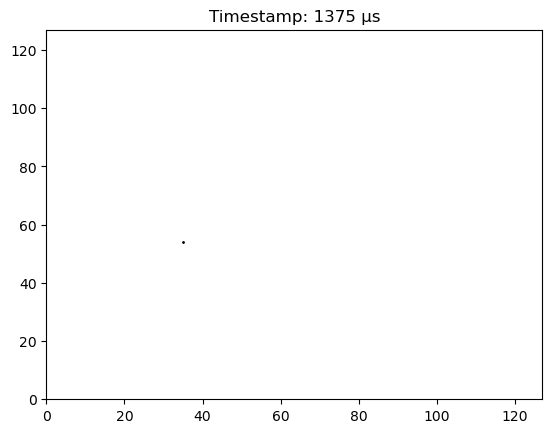

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML

def visualize_dvs_data(dvs_data):
    # 将DVS数据分离成x坐标、y坐标和事件极性
    timestamps = dvs_data[:, 0]
    x_coordinates = dvs_data[:, 1]
    y_coordinates = dvs_data[:, 2]
    polarity = dvs_data[:, 3]

    # 创建一个空白散点图
    fig, ax = plt.subplots()
    sc = ax.scatter([], [], c=[], cmap='gray', marker='o', s=1)
    ax.set_xlim(np.min(x_coordinates), np.max(x_coordinates))
    ax.set_ylim(np.min(y_coordinates), np.max(y_coordinates))

    def update(frame):
        # 获取当前帧的时间戳和数据
        current_timestamp = timestamps[frame]
        current_x = x_coordinates[frame]
        current_y = y_coordinates[frame]
        current_pol = polarity[frame]

        # 更新散点图的数据
        sc.set_offsets(np.column_stack((current_x, current_y)))
        sc.set_array([current_pol])

        # 设置标题显示当前时间戳
        ax.set_title(f"Timestamp: {current_timestamp} µs")

    ani = FuncAnimation(fig, update, frames=len(dvs_data), interval=50, repeat=False)

    # 在IPython环境中显示动态图
    display(HTML(ani.to_jshtml()))

if __name__ == "__main__":
    # 假设您的DVS数据存储在名为dvs_data的NumPy数组
    visualize_dvs_data(dvs_data)
